<div class="alert alert-block alert-danger">   
<p style="padding:50px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:50px;text-align:center;border-radius: 00px 00px;overflow:hidden;font-weight:500">Image Preprocessing Tasks</p></div> 

<strong>There are some tasks which we can perform in this Tutorial:</strong>
1. Capture 5 images and 1 video with the help of your Laptop's Camera using open-cv,
save them in a folder, load and plot in a subplot in your notebook.
2. Normalize any 1 image from the saved images in a folder between range of 0 - 1.
3. Convert the pixels having values greater than 150 to white color and the values smaller
than 150 to black color without using open-cv then plot and save.
4. Do the 3rd task with the help of open-cv then plot and save.
5. Create a 1D array of 10000 random values, convert it into a 2D array of 100x100 pixels
having 3 channels (RGB) then plot and save.
6. Using the image created in task 6, crop a 10x10 portion from the center then plot and
save.
7. Blur an image (with Gaussian Blur) using open-cv.
8. In an image, add number 10 to each pixel value and don't add if the pixel value exceeds
number 240 after adding then plot and save.
9. In an image, subtract number 10 from each pixel value and don't subtract if the pixel
value falls behind number 10 after subtraction then plot and save.
10. Capture a picture of a ceiling bulb with your phone and make the bright area white and
the rest of the area black then plot and save.
11. Resize an image.

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Importing Necessary Libraries</p>

Library is a collection of prewritten code that programmers can use to optimize tasks.The libraries allow users to choose from frameworks that they can build off of to produce new machine learning (ML) models. There are some important libraries which we are using in Image Preprocessing.

In [1]:
import cv2                          # OpenCv library is used to perform processing on image.

import numpy as np                  # Numpy library is used to work with Arrays.

import matplotlib.pyplot as plt     # matplotlib library is used for data visualization.

from IPython.display import Video   # Importing a video function from IPython.display library

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Read Image from Directory</p>

All the files are store in computer Directories. first we can call image from the directory then we perform any process on the image.

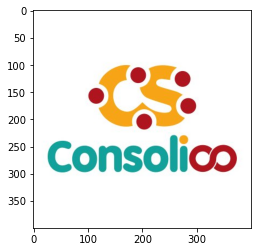

In [2]:
# reading image from directory
img = cv2.imread('Consolio.jpg')     
# convert BGR image to RGD
n_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convertng image in numpy array
np_image=np.asarray(n_img)
# displaying the image
plt.imshow(np_image)

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Read Video from Directory</p>

read video from directory with Importing a video function from IPython.display library.

In [3]:
Video("Consolioo.mp4",embed =True, width=500, height=300)

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Capture Images Using OpenCv</p>

In [5]:
cam = cv2.VideoCapture(0)

cv2.namedWindow("testing")

img_counter = 0

while True:
    ret, frame = cam.read()
    if not ret:
        print("failed to grab frame")
        break
    cv2.imshow("testing", frame)

    k = cv2.waitKey(0)
    if k == 27:
        # ESC pressed
        print("Escape hit, closing...")
        break
    elif k == 32:
        # SPACE pressed
        img_name = "opencv_frame_{}.png".format(img_counter)
        cv2.imwrite(img_name, frame) 
        print("{} written!".format(img_name))
        img_counter += 1

cam.release()

cv2.destroyAllWindows()

Escape hit, closing...


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Capture Video Using OpenCv</p>

In [4]:
#video read from camera
video = cv2.VideoCapture(0)

# check if camera
# is opened or not
if (video.isOpened() == False):
    print("Error reading video file")

# We need to set resolutions.
# so, convert them from float to integer.
frame_width = int(video.get(3))
frame_height = int(video.get(4))

size = (frame_width, frame_height)

# VideoWriter object will create
# a frame of above defined The output
# is stored in 'filename.mp4' file.
result = cv2.VideoWriter('filename.mp4',
                        cv2.VideoWriter_fourcc(*'MJPG'),
                        10, size)
while(True):
    ret, frame = video.read()

    if ret == True:

        # Write the frame into the
        # file 'filename.mp4'
        result.write(frame)

        # Display the frame and save the frame
        cv2.imshow('Frame', frame)

        # Press S on keyboard to stop video recording
        if cv2.waitKey(1) & 0xFF == ord('s'):
            break

    # Break the loop
    else:
        break

# When everything done, release
# the video capture and video
# write objects
video.release()
result.release()
# Closes all the frames
cv2.destroyAllWindows()

print("The video was successfully saved")


The video was successfully saved


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Normalizaton of Image with Range 0-1</p>

The range of the pixel values is between 0 to 256. Each number of pixel represents a color code. When using the image as it is and passing through a Deep Neural Network, the computation of high numeric values may become more complex. To reduce this we can normalize the values to range from 0 to 1.Subtract and Add values in each-pixel value of image.

Before Normalize min: 0
Before Normalize max: 255
After Normalize min: 0.0
After Normalize max: 1.0


Text(0.5, 1.0, 'Normalize')

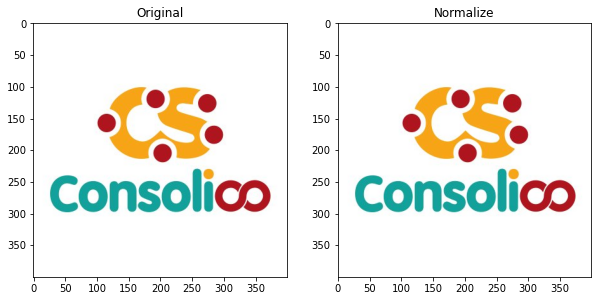

In [6]:
normal_img=cv2.imread("Consolio.jpg")

BGR_image1=cv2.cvtColor(normal_img, cv2.COLOR_BGR2RGB)

np_image=np.asarray(BGR_image1)

#show the max and min value in numpy array
print('Before Normalize min:', np_image.min())
print('Before Normalize max:', np_image.max())

#divide all pixel values with 255
np_image2=np_image/255

#after the normalizaton of image 
print('After Normalize min:', np_image2.min())
print('After Normalize max:', np_image2.max())

#adjust the size of plot 10x10
fig = plt.figure(figsize=(10, 10))

rows = 1
cols = 2

# Adds a subplot at the 1st position
fig.add_subplot(rows, cols, 1)

# showing image
plt.imshow(np_image)
plt.title("Original")

# Adds a subplot at the 2nd position
fig.add_subplot(rows, cols, 2)

# showing image
plt.imshow(np_image2)
plt.title("Normalize")


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Black & White image Convertion Using threshold() </p>

Image thresholding is a simple way of partitioning in image of objectt into foreground pixels from background pixels. 

Text(0.5, 1.0, 'THRESH_TOZERO_INV')

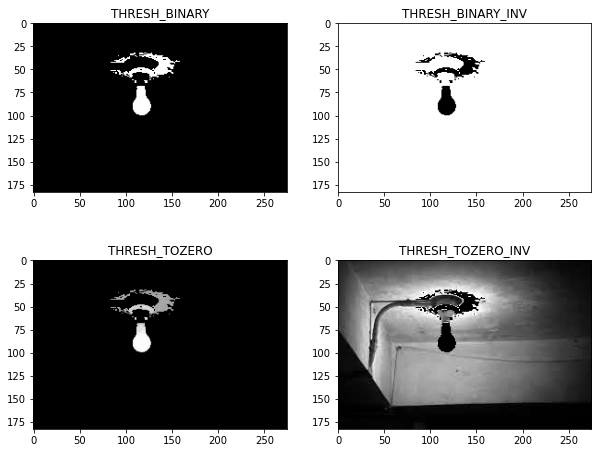

In [7]:
image1 = cv2.imread('bulb_image.jfif')

img = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)



ret, thresh1 = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img, 150, 255, cv2.THRESH_TOZERO)
ret, thresh4 = cv2.threshold(img, 150, 255, cv2.THRESH_TOZERO_INV)

fig = plt.figure(figsize=(10, 8))

rows = 2
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(thresh1,cmap='gray')
plt.title("THRESH_BINARY")

fig.add_subplot(rows, columns, 2)

plt.imshow(thresh2,cmap='gray')
plt.title("THRESH_BINARY_INV")

fig.add_subplot(rows, columns, 3)

plt.imshow(thresh3,cmap='gray')
plt.title("THRESH_TOZERO")

fig.add_subplot(rows, columns, 4)

plt.imshow(thresh4,cmap='gray')
plt.title("THRESH_TOZERO_INV")


# Without using OpenCv

(-0.5, 274.5, 182.5, -0.5)

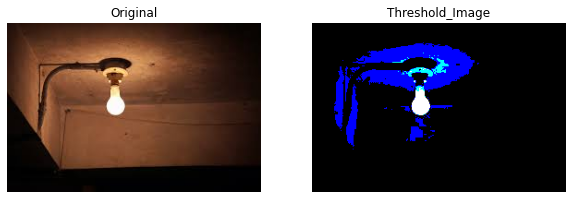

In [8]:
Img_bulb=cv2.imread("bulb_image.jfif")

grayscale_img=cv2.cvtColor(Img_bulb, cv2.COLOR_BGR2RGB)

img_array=np.asarray(Img_bulb)

#each pixel of image have greater than 150 value
#to assign him 255
img_array[img_array>=150] = 255

#each pixel of image have less than 150 value
#to assign him 0
img_array[img_array<150] = 0

cv2.imwrite('Threshold with OpenCv.jpeg', img_array )

fig = plt.figure(figsize=(10, 8))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img,cmap='gray')
plt.title("Original")
plt.axis('off')

fig.add_subplot(rows, columns, 2)

plt.imshow(img_array,cmap='gray')
plt.title("Threshold_Image")
plt.axis('off')



# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> threshold() Using OpenCv</p>

(-0.5, 274.5, 182.5, -0.5)

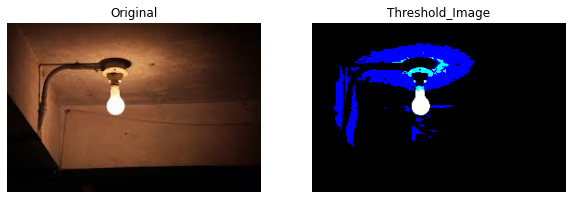

In [9]:
image1 = cv2.imread('bulb_image.jfif')

grayscale_img1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

ret, thresh1 = cv2.threshold(image1, 150, 255, cv2.THRESH_BINARY)

fig = plt.figure(figsize=(10, 8))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img1)
plt.title("Original")
plt.axis('off')

fig.add_subplot(rows, columns, 2)

plt.imshow(thresh1)
plt.title("Threshold_Image")
plt.axis('off')


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Converting 1D array in 2D with 100x100 pixels having 3 channels (RGB)</p>

Dimentions: 1
1D-Array: [176  61  68 ...  37  98 163]
Dimentions: 3
2D-Array: [[[176  61  68]
  [176  36  25]
  [122 112 140]
  ...
  [ 71  60 247]
  [130  94 113]
  [ 48 189  36]]

 [[ 27  36  46]
  [164  83  45]
  [ 49   4 119]
  ...
  [ 15  27 158]
  [225 161 220]
  [  4  53  89]]

 [[ 23  15  78]
  [206  83  34]
  [218 226 202]
  ...
  [175 142 198]
  [ 52 127 102]
  [195  47 232]]

 ...

 [[188 189 214]
  [217 187 206]
  [ 64  13 178]
  ...
  [181 204 153]
  [ 82 136  55]
  [ 10  85 208]]

 [[134  90 192]
  [ 30 107 119]
  [ 93 109 115]
  ...
  [ 37 238  45]
  [ 41 142  48]
  [219  73 168]]

 [[ 57  17 168]
  [184 217 213]
  [172  43 211]
  ...
  [235  71  93]
  [122 148 252]
  [ 37  98 163]]]


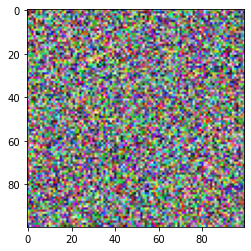

In [10]:
random_array = np.random.randint(0, 256, size=30000) 
print('Dimentions:',random_array.ndim)
print("1D-Array:",random_array)
two_Dim_array=np.reshape(random_array, (100,100,3))
print('Dimentions:',two_Dim_array.ndim)
print("2D-Array:",two_Dim_array)
cv2.imwrite('image with RGB channels.jpg',two_Dim_array )
plt.imshow(two_Dim_array)

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Image Croping</p>

 Crop the image to improving visual quality of image, which cuts away unwanted areas outside of a selected rectangular region.

Rows: 960
Cols: 864


(-0.5, 99.5, 99.5, -0.5)

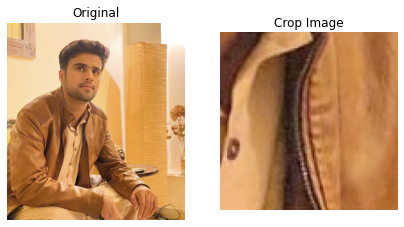

In [11]:
crop=cv2.imread("haroon.jpeg")

grayscale_img2=cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

rows, cols, _ =grayscale_img2.shape

print("Rows:", rows)
print("Cols:", cols)

img_crop=grayscale_img2[480:580, 332:432 ]

cv2.imwrite('Crope_image.jpg', img_crop)


fig = plt.figure(figsize=(7, 7))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img2)
plt.title("Original")
plt.axis('off')

fig.add_subplot(rows, columns, 2)

plt.imshow(img_crop)
plt.title("Crop Image")
plt.axis('off')


In [11]:
img_crop.shape

(100, 70, 3)

# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Blur image Using OpenCv</p>

# Simple Image Blur

(-0.5, 274.5, 182.5, -0.5)

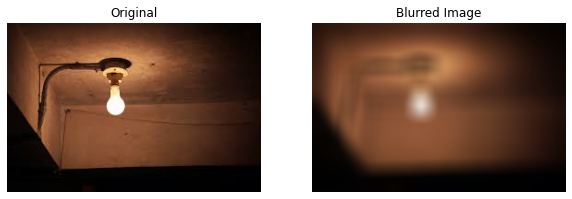

In [12]:
Blur_img = cv2.imread('bulb_image.jfif')

grayscale_img3=cv2.cvtColor(Blur_img, cv2.COLOR_BGR2RGB)

blur = cv2.blur(grayscale_img3,(20,20))

fig = plt.figure(figsize=(10, 10))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img3)
plt.title("Original")
plt.axis('off')

fig.add_subplot(rows, columns, 2)

plt.imshow(blur)
plt.title("Blurred Image")
plt.axis('off')


# Blur Image with Gaussian_Blur

(-0.5, 274.5, 182.5, -0.5)

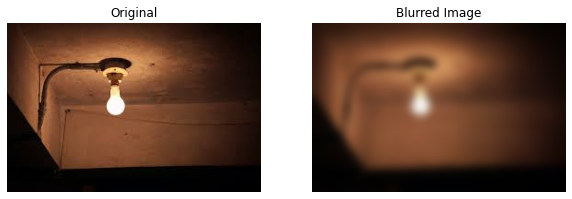

In [13]:
Blur_img1 = cv2.imread('bulb_image.jfif')

grayscale_img4=cv2.cvtColor(Blur_img1, cv2.COLOR_BGR2RGB)

Gaussian_Blur = cv2.GaussianBlur(grayscale_img4,(29,29),0)

fig = plt.figure(figsize=(10, 10))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img4)
plt.title("Original")
plt.axis('off')

fig.add_subplot(rows, columns, 2)

plt.imshow(Gaussian_Blur)
plt.title("Blurred Image")
plt.axis('off')


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Add 10 in the image pixels </p>

Text(0.5, 1.0, 'Add 10 in each pixel')

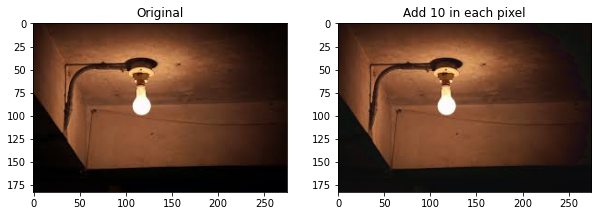

In [14]:
img_pixel=cv2.imread("bulb_image.jfif")

grayscale_img5=cv2.cvtColor(img_pixel, cv2.COLOR_BGR2RGB)

flat_array = grayscale_img5.flatten()
for i in range(len(flat_array)):
    if flat_array[i]<=10:
        flat_array[i]=flat_array[i]+10 
    else:
        pass
        
resize_arr = np.reshape(flat_array, (183, 275, 3))

cv2.imwrite('Add 10_pixel.jpg', resize_arr)

fig = plt.figure(figsize=(10, 10))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img5)
plt.title("Original")

fig.add_subplot(rows, columns, 2)

plt.imshow(resize_arr)
plt.title("Add 10 in each pixel")


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Subtract 10 from the image pixels </p>


The range of the pixel values is between 0 to 256. Each number of pixel represents a color code. When using the image as it is and passing through a Deep Neural Network, the computation of high numeric values may become more complex. To reduce this we can normalize the values to range from 0 to 1 and Subtract values from the each-pixel value of image.

Text(0.5, 1.0, 'Sub 10 from each Pixel')

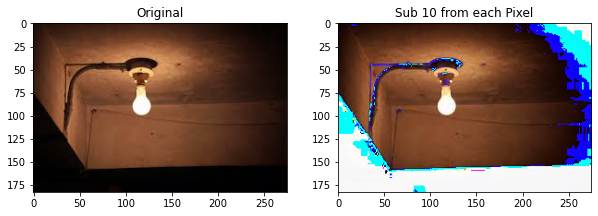

In [15]:
img_pixel1=cv2.imread("bulb_image.jfif")

grayscale_img6=cv2.cvtColor(img_pixel1, cv2.COLOR_BGR2RGB)

flat_array1 = grayscale_img6.flatten()

for i in range(len(flat_array1)):
    if flat_array1[i]>=246:
        pass
    else:
        flat_array1[i]=flat_array1[i]-10 
        
resize_array = np.reshape(flat_array1, (183, 275, 3))

cv2.imwrite('Sub 10_pixel.jpg', resize_array)

fig = plt.figure(figsize=(10, 10))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(grayscale_img6)
plt.title("Original")

fig.add_subplot(rows, columns, 2)

plt.imshow(resize_array)
plt.title("Sub 10 from each Pixel")


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> picture of a ceiling bulb make the bright area white and the rest of the area black </p>


Rows: 183
Cols: 275


Text(0.5, 1.0, 'Croped')

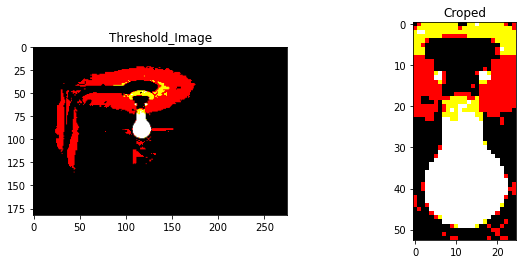

In [17]:
ceiling_bulb  = cv2.imread('bulb_image.jfif')

grayscale_img7=cv2.cvtColor(ceiling_bulb, cv2.COLOR_BGR2RGB)

ret, threshold_image = cv2.threshold(grayscale_img7, 150, 255, cv2.THRESH_BINARY)

cv2.imwrite('ceiling-bulb.jpg',threshold_image)


rows, cols, _ =threshold_image.shape

print("Rows:", rows)
print("Cols:", cols)

img_crop01=threshold_image[50:103, 105:130 ]

cv2.imwrite('Crope_image.jpg', img_crop01)

fig = plt.figure(figsize=(10, 4))

rows = 1
columns = 2

fig.add_subplot(rows, columns, 1)

plt.imshow(threshold_image)
plt.title("Threshold_Image")

fig.add_subplot(rows, columns, 2)

plt.imshow(img_crop01)
plt.title("Croped")


# <a id="20"></a>
<p style="padding:10px;background-color:#0f0d0d;margin:0;color:#e9c46a;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500"> Image Resizing</p>

Resizing images is a critical preprocessing step in computer vision. Principally, our machine learning models train faster on smaller images. To resize the image there used a function of openCv library resize().

Before Resize: (400, 400, 3)
After Resize: (400, 500, 3)


Text(0.5, 1.0, 'Resize')

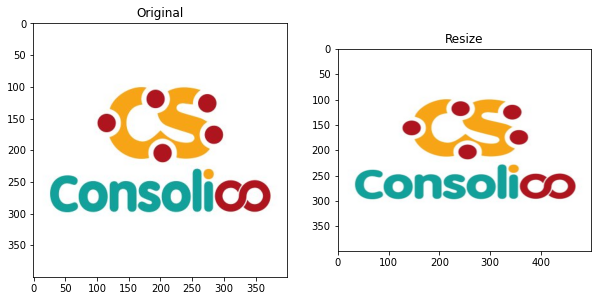

In [18]:
Consolio=cv2.imread('Consolio.jpg')

grayscale_img8=cv2.cvtColor(Consolio, cv2.COLOR_BGR2RGB)

np_array=np.asarray(grayscale_img8)

print("Before Resize:",np_array.shape)

resize_image=cv2.resize(np_array,(500,400))

print("After Resize:",resize_image.shape)

fig = plt.figure(figsize=(10, 10))

rows = 1
cols = 2

fig.add_subplot(rows, cols, 1)

plt.imshow(grayscale_img8)
plt.title("Original")

fig.add_subplot(rows, cols, 2)

plt.imshow(resize_image)
plt.title("Resize")
